#### title : Learning Deep Features for Discriminative Localization
#### author : Zhou et  al.
#### year : 2016

1. idea
* CNN이 이미지 분류 시 어떤 영역에 주목하는지 시각화하는 기법. 별도의 localization 학습 없이도 분류 모델이 객체의 위치를 파악할 수 있음을 보여줌.
2. 메커니즘
* Global Average Pooling(GAP)를 사용하여 각 feature map의 공간 정보를 보존
* 마지막 convolutional layer의 feature maps에 분류 가중치를 적용
* 가중합을 통해 클래스별 활성화 맵 생성
3. 세부사항
* 기존 fully connected layer를 GAP + 단일 linear layer로 대체
* 각 feature map에 해당하는 가중치가 특정 클래스에 대한 중요도를 나타냄
* $CAM \; = \; \sum(weight_k \; \times \;feature \; map_k)$


### 1. imports

In [1]:
import torch
import torchvision
import PIL
import requests
import io
import matplotlib.pyplot as plt

### 2. 이미지 자료 처리

#### A. 데이터

`-` 데이터 다운로드

In [2]:
torchvision.__version__

'0.20.1'

In [3]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category'
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category'
)

`-` **고양이는 0, 강아지는 1**

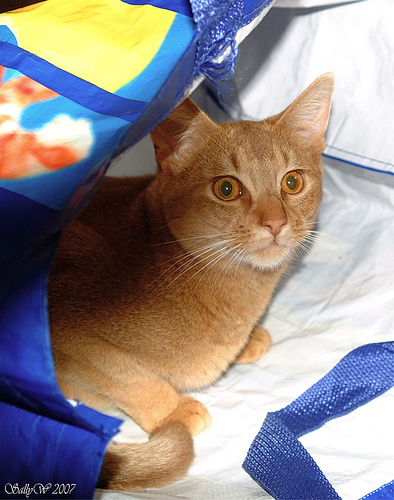

In [5]:
train_dataset[0][0]

In [6]:
train_dataset[0][1]

0

#### B. 이미지 변환

`-` `x_pil` 을 tensor로 바꾸어 보자

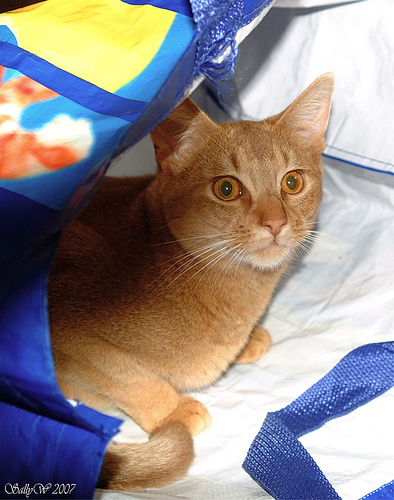

In [7]:
x_pil = train_dataset[0][0]
x_pil

In [10]:
to_tensor = torchvision.transforms.ToTensor() # PIL를 텐서로 만드는 함수를 리턴
x_tensor=to_tensor(x_pil)
print(x_tensor.shape)
x_tensor

torch.Size([3, 500, 394])


tensor([[[0.1451, 0.1373, 0.1412,  ..., 0.9686, 0.9765, 0.9765],
         [0.1373, 0.1373, 0.1451,  ..., 0.9647, 0.9725, 0.9765],
         [0.1373, 0.1412, 0.1529,  ..., 0.9686, 0.9804, 0.9804],
         ...,
         [0.0196, 0.0157, 0.0157,  ..., 0.2863, 0.2471, 0.2706],
         [0.0157, 0.0118, 0.0118,  ..., 0.2392, 0.2157, 0.2510],
         [0.1098, 0.1098, 0.1059,  ..., 0.2314, 0.2549, 0.2980]],

        [[0.0784, 0.0706, 0.0745,  ..., 0.9725, 0.9725, 0.9725],
         [0.0706, 0.0706, 0.0784,  ..., 0.9686, 0.9686, 0.9725],
         [0.0706, 0.0745, 0.0863,  ..., 0.9647, 0.9765, 0.9765],
         ...,
         [0.0235, 0.0196, 0.0196,  ..., 0.4627, 0.4039, 0.4314],
         [0.0118, 0.0078, 0.0078,  ..., 0.3882, 0.3843, 0.4235],
         [0.1059, 0.1059, 0.1059,  ..., 0.3686, 0.4157, 0.4588]],

        [[0.0471, 0.0392, 0.0431,  ..., 0.9922, 0.9922, 0.9922],
         [0.0392, 0.0392, 0.0471,  ..., 0.9843, 0.9882, 0.9922],
         [0.0392, 0.0431, 0.0549,  ..., 0.9843, 0.9961, 0.

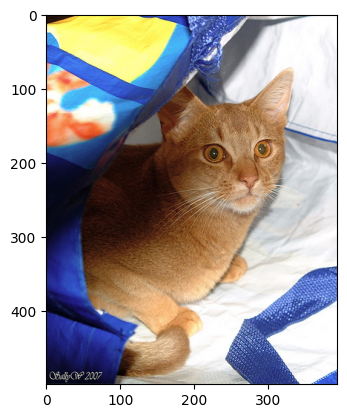

In [11]:
plt.imshow(to_tensor(x_pil) .permute(1,2,0))

`-` 궁극적으로는 `train_dataset`의 모든 이미지를 `(3680,3,???,???)`로
정리하여 `X`라고 하고 싶음. $\to$ 이걸 하기 위해서는 이미지 크기를
통일시켜야함. $\to$ 이미지크기를 통일시키는 방법을 알아보자.

In [15]:
to_tensor(train_dataset[0][0]).shape

torch.Size([3, 500, 394])

In [14]:
to_tensor(train_dataset[1][0]).shape

torch.Size([3, 313, 450])

`-` 512,512로 이미지 조정

In [16]:
resize = torchvision.transforms.Resize((512,512)) # 512,512로 이미지를 조정해주는 함수가 리턴

In [18]:
to_tensor(resize(train_dataset[0][0])).shape

torch.Size([3, 512, 512])

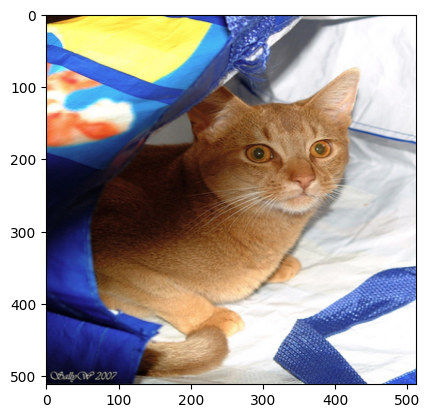

In [21]:
plt.imshow(to_tensor(resize(train_dataset[0][0])).permute(1,2,0))

`-` 크기가 8인 이미지들의 배치를 만들기

In [22]:
Xm = torch.stack([to_tensor(resize(train_dataset[n][0])) for n in range(8)],axis=0)
Xm.shape

torch.Size([8, 3, 512, 512])

#### 5. AP Layer

`-` 채널별로 평균을 구하는 Layer

In [23]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)

In [24]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4).float()
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [25]:
ap(X) # 채널별평균

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

#### B.AP, Linear의 교환

In [26]:
r = X[:,0,:,:]
g = X[:,1,:,:]
b = X[:,2,:,:]

In [29]:
ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

tensor([[[17.3000]]])

In [30]:
ap(r*0.1 + g*0.2 + b*0.3)

tensor([[[17.3000]]])

`-` 위의 두 계산결과를 `torch.nn.AdaptiveAvgPool2d`, `torch.nn.Linear`,
그리고 `torch.nn.Flatten()`을 조합하여 구현해보자.

In [32]:
# ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
flattn = torch.nn.Flatten()
linr = torch.nn.Linear(3,1,bias=False)
linr.weight.data = torch.tensor([[ 0.1,  0.2, 0.3]])
#---#
print(X.shape)
print(ap(X).shape) # ap(r), ap(g), ap(b) 의 값이 들어있음.
print(flattn(ap(X)).shape) # [ap(r), ap(g), ap(b)] 형태로
print(linr(flattn(ap(X))).shape) # ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

torch.Size([1, 3, 4, 4])
torch.Size([1, 3, 1, 1])
torch.Size([1, 3])
torch.Size([1, 1])


In [33]:
#ap(r*0.1 + g*0.2 + b*0.3)
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
flattn = torch.nn.Flatten()
linr = torch.nn.Linear(3,1,bias=False)
linr.weight.data = torch.tensor([[ 0.1,  0.2, 0.3]])
#---#
def _linr(X):
    return torch.einsum('ocij, kc -> okij', X, linr.weight.data)
#---#
print(X.shape) # 
print(_linr(X).shape) # r*0.1 + g*0.2 + b*0.3 
print(ap(_linr(X)).shape) # ap(r*0.1 + g*0.2 + b*0.3 )
print(flattn(ap(_linr(X))).shape)

torch.Size([1, 3, 4, 4])
torch.Size([1, 1, 4, 4])
torch.Size([1, 1, 1, 1])
torch.Size([1, 1])


### 5. CAM(Ahou et al. 2016)의 구현

#### A. 0단계 – (X,y), (XX,yy)

In [35]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category',
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category',
)

In [36]:
compose = torchvision.transforms.Compose([
    torchvision.transforms.Resize((512,512)),
    torchvision.transforms.ToTensor()
])

In [37]:
X = torch.stack([compose(train_dataset[i][0]) for i in range(3680)],axis=0)
XX = torch.stack([compose(test_dataset[i][0]) for i in range(3669)],axis=0)
y = torch.tensor([train_dataset[i][1] for i in range(3680)]).reshape(-1,1).float()
yy = torch.tensor([test_dataset[i][1] for i in range(3669)]).reshape(-1,1).float()

#### B. 1단계 - 이미지 분류 잘하는 네트워크 선택 후 학습

In [ ]:
torch.manual_seed(43052)
#--Step1
ds_train = torch.utils.data.TensorDataset(X,y)
dl_train = torch.utils.data.DataLoader(ds_train, batch_size=32, shuffle=True)
ds_test = torch.utils.data.TensorDataset(XX,yy)
dl_test = torch.utils.data.DataLoader(ds_test, batch_size=32)
#--Step2
resnet18 = torchvision.models.resnet18(pretrained=True)
resnet18.fc = torch.nn.Linear(512,1)
loss_fn = torch.nn.BCEWithLogitsLoss()
optimizr = torch.optim.Adam(resnet18.parameters(), lr=1e-5)
#--Step3 
resnet18.to("cuda:0")
for epoc in range(3):
    resnet18.train()
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        #1
        netout = resnet18(Xm)
        #2
        loss = loss_fn(netout,ym)
        #3
        loss.backward()
        #4
        optimizr.step()
        optimizr.zero_grad()
    #---# 
    resnet18.eval()
    s = 0 
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        s = s + ((resnet18(Xm).data > 0) == ym).sum().item()
    acc = s/3680
    print(f"train_acc = {acc:.4f}")
#--Step4 
resnet18.eval()
s = 0 
for Xm,ym in dl_test:
    Xm = Xm.to("cuda:0")
    ym = ym.to("cuda:0")
    s = s + ((resnet18(Xm).data > 0) == ym).sum().item()
acc = s/3669
print(f"test_acc = {acc:.4f}")

#### C. 2단계 - Linear 와 AP의 순서를 바꿈

`-` `resnet18`을 재구성하여 `net`을 만들자

In [45]:
stem = torch.nn.Sequential(
    torch.nn.Sequential(
        resnet18.conv1,
        resnet18.bn1,
        resnet18.relu,
        resnet18.maxpool
    ),
    resnet18.layer1,
    resnet18.layer2,
    resnet18.layer3,
    resnet18.layer4
)
head = torch.nn.Sequential(
    resnet18.avgpool,
    torch.nn.Flatten(),
    resnet18.fc
)
net = torch.nn.Sequential(
    stem,
    head
)

`-` 아직은 `resnet18`과 똑같은 기능, **인덱스로 접근 가능!**

`-` 1개의 observation을 고정

In [46]:
x = X[[0]].to("cuda:0")

`-` 이렇게 해도 될듯 

In [55]:
torch.stack([X[0]],axis=0).shape

torch.Size([1, 3, 512, 512])

In [57]:
net(x), resnet18(x)

(tensor([[-5.5534]], device='cuda:0', grad_fn=<AddmmBackward0>),
 tensor([[-5.5534]], device='cuda:0', grad_fn=<AddmmBackward0>))

`-` 위와 같은 값 -5.5534이 나오는 과정을 추적하여 보자.

In [58]:
# 계산방식1: 원래계산방식
ap = head[0]
flattn = head[1]
linr = head[2]
#---#
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{ap(stem(x)).shape} -- ap(stem(x))")
print(f"{flattn(ap(stem(x))).shape} -- flattn(ap(stem(x)))")
print(f"{linr(flattn(ap(stem(x)))).shape} -- linr(flattn(ap(stem(x))))")

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 512, 1, 1]) -- ap(stem(x))
torch.Size([1, 512]) -- flattn(ap(stem(x)))
torch.Size([1, 1]) -- linr(flattn(ap(stem(x))))


**현재 네트워크**
$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linr}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$

**바꾸고 싶은 네트워크**
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{\_linr}{\to} \underset{(1,1,16,16)}{{\boldsymbol \sharp}}\overset{ap}{\to} \underset{(1,1,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$

In [59]:
# 계산방식2
ap = head[0]
flattn = head[1]
linr = head[2]
def _linr(xtilde):
    return torch.einsum('ocij, kc -> okij', xtilde, linr.weight.data) + linr.bias.data
#---#
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{_linr(stem(x)).shape} -- _linr(stem(x))")
print(f"{ap(_linr(stem(x))).shape} -- ap(_linr(stem(x)))")
print(f"{flattn(ap(_linr(stem(x)))).shape} -- flattn(ap(_linr(stem(x))))")

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 1, 16, 16]) -- _linr(stem(x))
torch.Size([1, 1, 1, 1]) -- ap(_linr(stem(x)))
torch.Size([1, 1]) -- flattn(ap(_linr(stem(x))))


In [60]:
linr(flattn(ap(stem(x)))), flattn(ap(_linr(stem(x))))

(tensor([[-5.5534]], device='cuda:0', grad_fn=<AddmmBackward0>),
 tensor([[-5.5534]], device='cuda:0', grad_fn=<ViewBackward0>))

`-` 원래 계산방식을 적용

In [61]:
linr(flattn(ap(stem(x))))

tensor([[-5.5534]], device='cuda:0', grad_fn=<AddmmBackward0>)

`-` 바뀐 계산방식을 적용

In [62]:
flattn(ap(_linr(stem(x))))

tensor([[-5.5534]], device='cuda:0', grad_fn=<ViewBackward0>)

`-` 바뀐 계산방식을 좀더 파고 들어서 분석해보자.

In [63]:
_linr(stem(x)).long()

tensor([[[[  0,   0,   0,   0,   0,   0,   0,   0,  -1,  -2,  -2,  -2,   0,   0,
             0,   0],
          [  0,   0,   0,   0,   0,   0,   0,  -1,   0,  -2,  -3,  -4,  -1,   0,
             0,   0],
          [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  -3,  -5,  -4,  -2,
             0,   0],
          [  0,   0,   0,   0,   0,   0,   0,   0,  -1,  -4,  -9, -12, -12,  -8,
            -2,   0],
          [  0,   0,   0,   0,   0,   0,  -1,  -5, -11, -16, -20, -24, -22, -14,
            -4,   0],
          [ -1,  -1,   0,   0,   0,   0,  -5, -16, -28, -35, -40, -42, -37, -23,
            -7,   0],
          [ -1,  -1,   0,   0,   0,   0, -10, -28, -47, -56, -56, -52, -42, -25,
            -7,   0],
          [  0,  -1,   0,   0,   0,   0, -11, -29, -49, -57, -54, -47, -34, -19,
            -4,   1],
          [  0,   0,   0,   0,   0,   0,  -8, -21, -36, -42, -38, -29, -18,  -8,
            -1,   0],
          [  0,   0,  -1,  -1,   0,   0,  -3,  -9, -16, -19, -16, -11,  -

-   여러가지 값들이 있지만 (16\*16=256개의 값들) 아무튼 이 값들의 평균은
    -5.5613 임. (이 값이 작을수록 이 그림은 고양이라는 의미임)
-   그런데 살펴보니까 대부분의 위치에서 -에 가까운 값을가지고,
    특정위치에서만 엄청 작은 값이 존재하여 -5.5613 이라는 평균값이
    나오는 것임.
-   결국 이 특정위치에 존재하는 엄청 작은 값들이 `x`가 고양이라고
    판단하는 근거가 된다.

**바꾸고 싶은 네트워크** – why라는 이름을 적용하여
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{\_linr}{\to} \underset{(1,1,16,16)}{\bf why}\overset{ap}{\to} \underset{(1,1,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,1)}{logit}\right) = [[-5.5613]]$$


In [66]:
why = _linr(stem(x)) 

#### D. 3단계 -WHY 시각화

`-` 시각화1 - why와 img를 겹쳐서 그려보자

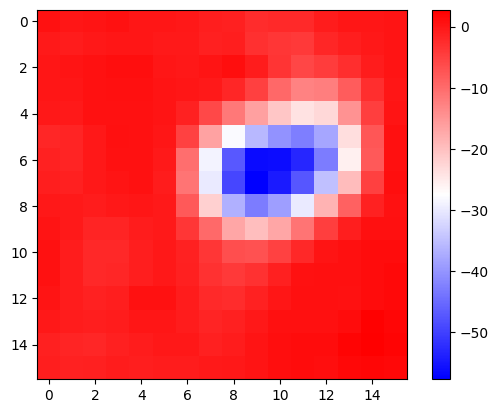

In [67]:
plt.imshow(why.squeeze().cpu().detach(),cmap="bwr")
plt.colorbar()

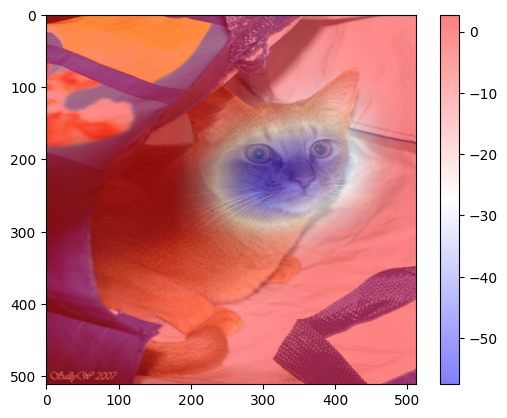

In [68]:
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="bwr",alpha=0.5)
plt.colorbar()

`-` 시각화2 - colormap을 `magma`로 적용

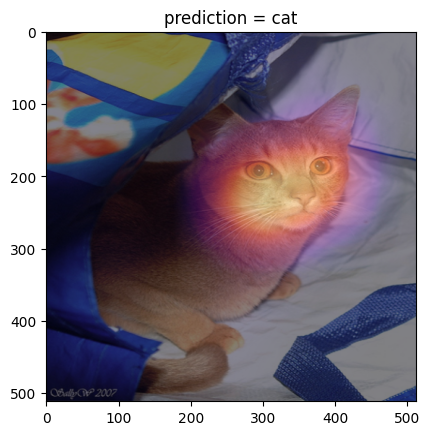

In [69]:
x = X[[0]].to("cuda:0")
if net(x) > 0: 
    pred = "dog"
    why = _linr(stem(x)) 
else: 
    pred = "cat" 
    why = - _linr(stem(x)) 
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`-` 시각화3 - 하니를 시각화

In [70]:
url = 'https://github.com/guebin/DL2025/blob/main/imgs/hani1.jpeg?raw=true'
hani_pil = PIL.Image.open(
    io.BytesIO(requests.get(url).content)
)

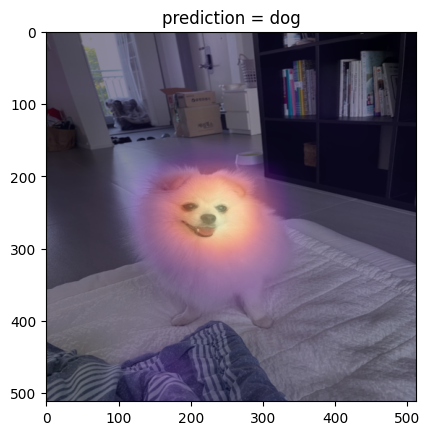

In [71]:
x = compose(hani_pil).reshape(1,3,512,512).to("cuda:0")
if net(x) > 0: 
    pred = "dog"
    why = _linr(stem(x)) 
else: 
    pred = "cat" 
    why = - _linr(stem(x)) 
plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512,512),
    mode="bilinear",
)
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`-` 시각화4 - `XX`의 이미지를 시각화해보자

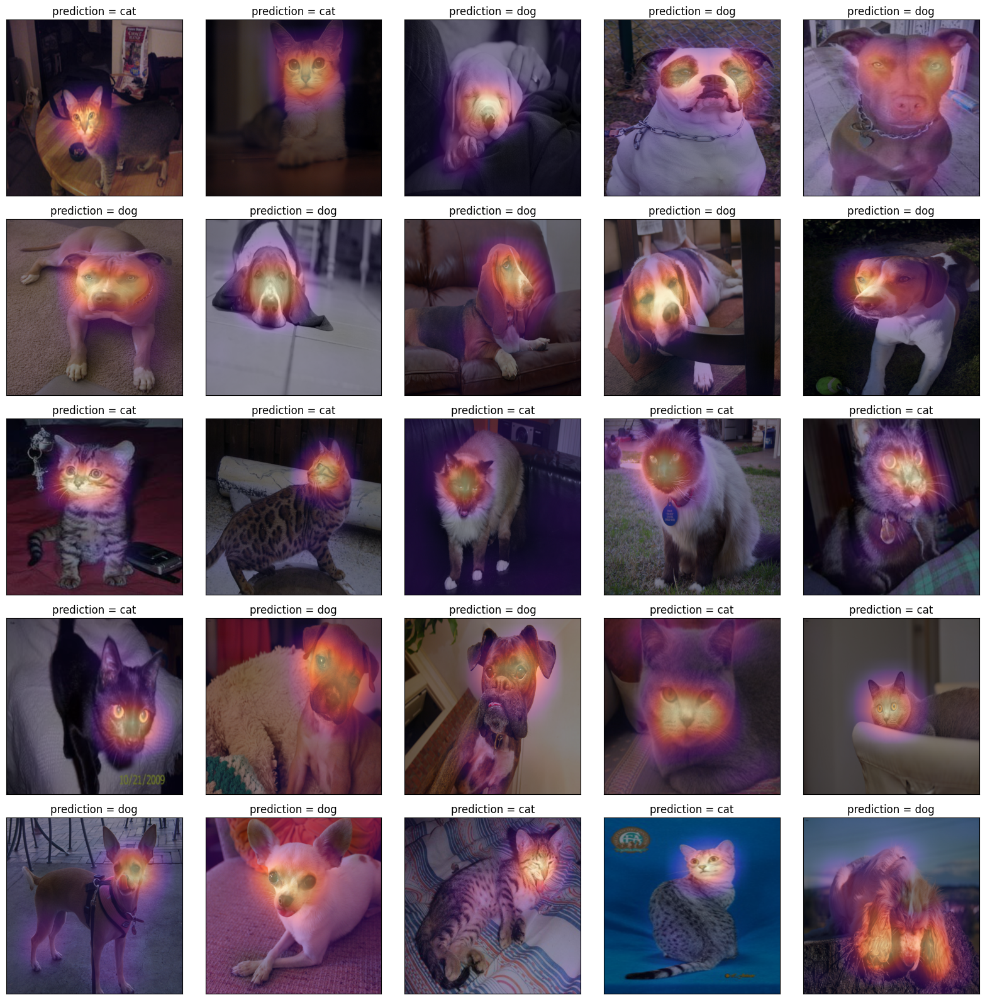

In [74]:
fig, ax = plt.subplots(5,5)
#---#
k = 0
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

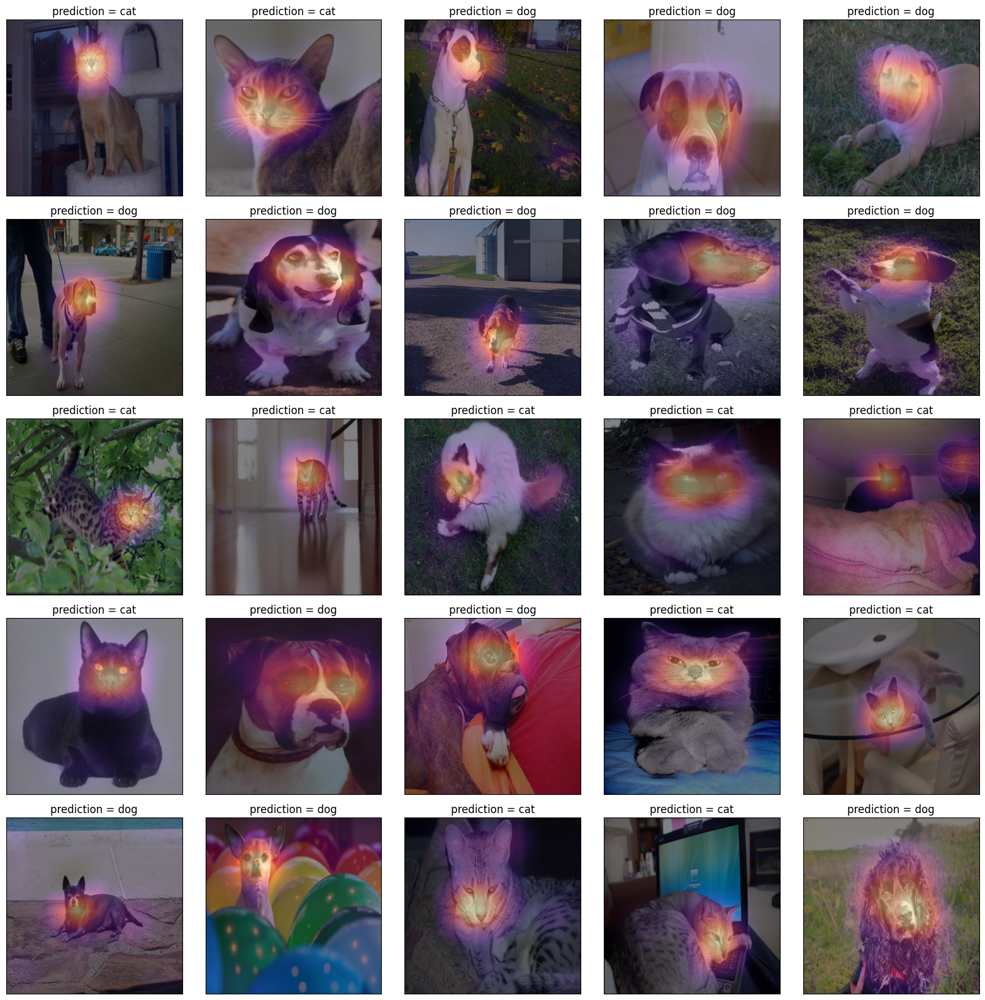

In [72]:
fig, ax = plt.subplots(5,5)
#---#
k = 1 
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

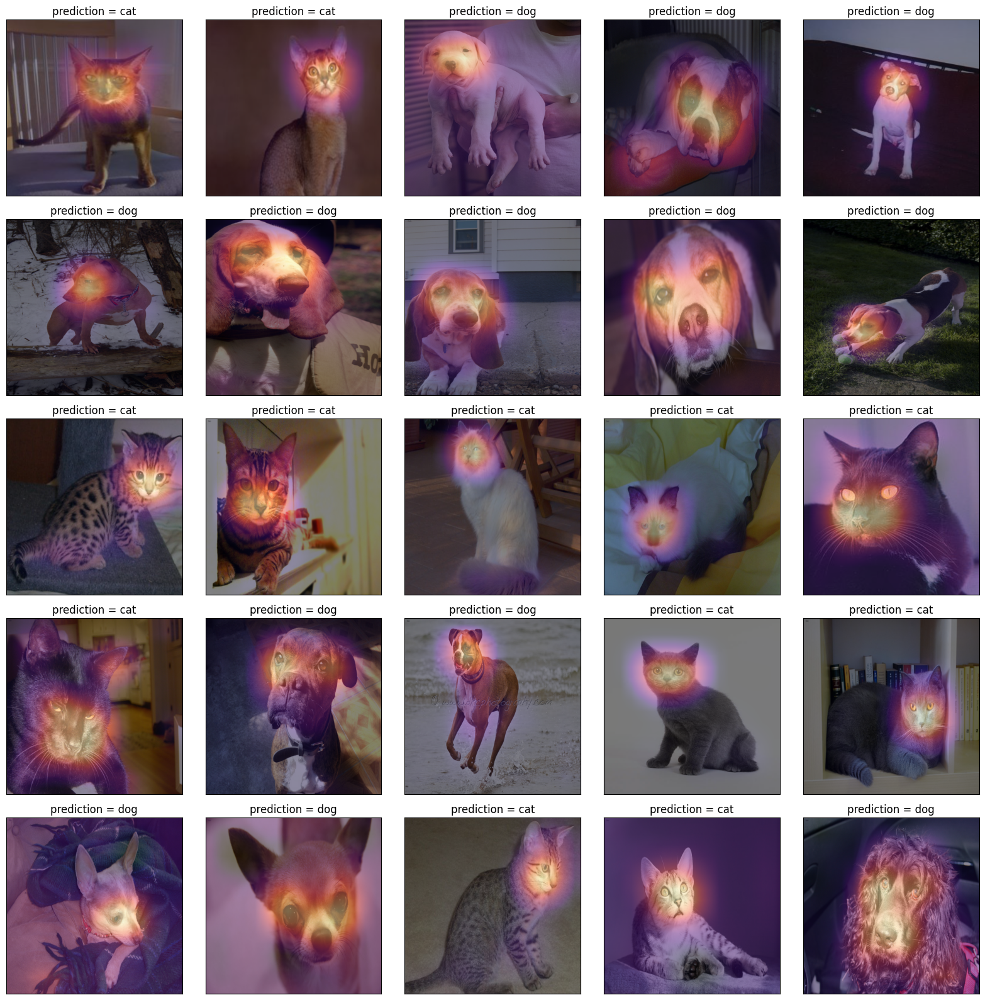

In [73]:
fig, ax = plt.subplots(5,5)
#---#
k = 2
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

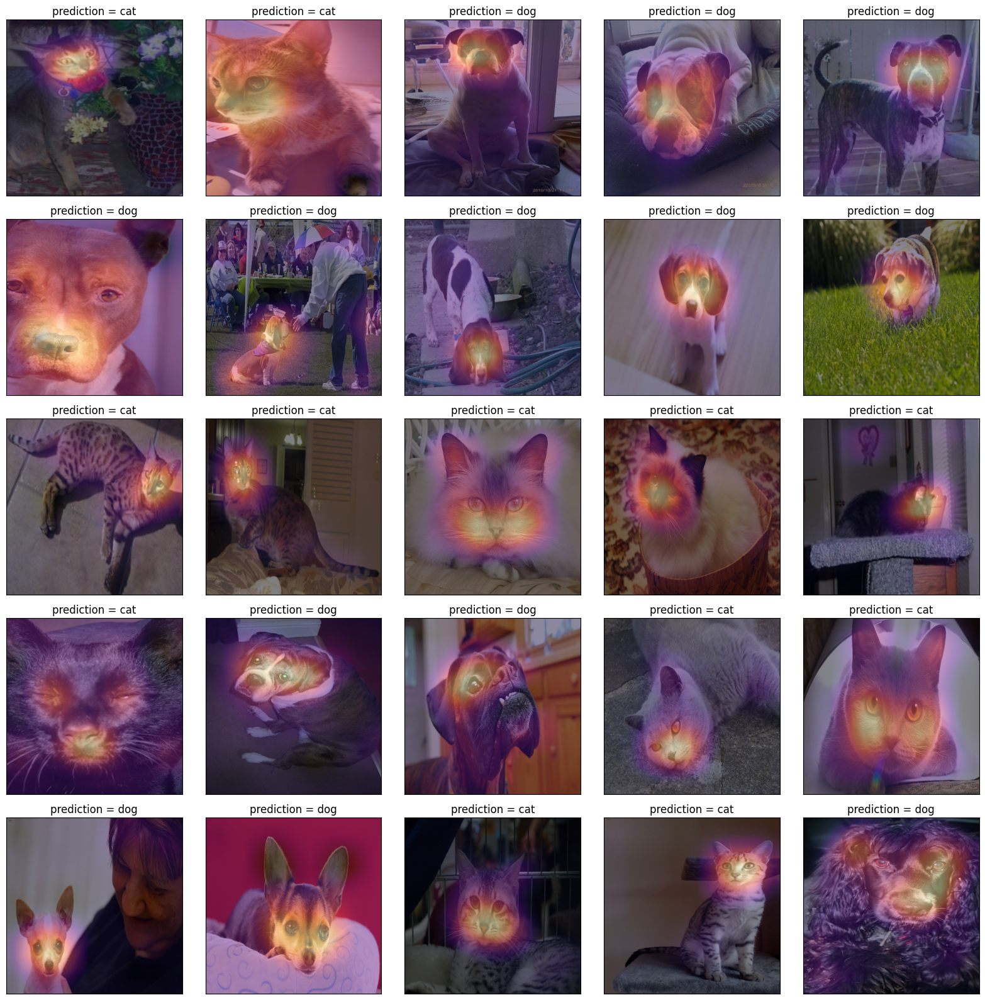

In [75]:
fig, ax = plt.subplots(5,5)
#---#
k = 3
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x) > 0: 
            pred = "dog"
            why = _linr(stem(x)) 
        else: 
            pred = "cat" 
            why = - _linr(stem(x)) 
        plt.imshow(x.cpu().detach().squeeze().permute(1,2,0))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512,512),
            mode="bilinear",
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
        ax[i][j].set_title(f"prediction = {pred}");
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        k = k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

### 6. CAM의 한계

`-` 구조적 제약이 있음

* head-part가 ap와 linr로만 구성되어야 가능
* 그렇지 않은 네트워크는 임의로 재구성하여 head-part를 ap와 linr로많 구성해야함(CAM을 적용하기 위한 구조로 만들기 위해)

`-` 이후로 등장한 `grad-cam`은 구조의 제약 없이 거의 모든 CNN에 적용 가능